THIS PROJECT NEEDS TO BE TRAINED AGAIN ON HIGHER PERFOMANCE GPU (was trained with low resolution on GTX 1060 3G, so the result was not good) 

In [1]:
import torch
import torch.nn as nn
import torch.utils.data as data
from torch.autograd import Variable
import torchvision
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

In [2]:
device = torch.device("cuda: 0") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cuda:0


In [3]:
DATA_DIR = "data/train"
DOMAIN_A_DIR = "data/train/A"
DOMAIN_B_DIR = "data/train/B"

In [27]:
PROCESS_DATA = 1
TRAIN_DATA = 0
IMG_SIZE = 256
BATCH_SIZE = 1

In [5]:
data_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE,IMG_SIZE)),
    transforms.CenterCrop((IMG_SIZE,IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [6]:
if PROCESS_DATA:
    dataset_A = datasets.ImageFolder(DOMAIN_A_DIR, transform=data_transform)
    dataloader_A = data.DataLoader(dataset_A, batch_size=BATCH_SIZE, num_workers= 2, shuffle= True)
    dataset_B = datasets.ImageFolder(DOMAIN_B_DIR, transform=data_transform)
    dataloader_B = data.DataLoader(dataset_B, batch_size=BATCH_SIZE, num_workers= 2, shuffle= True)

In [7]:
print("Domain A size: {}".format(len(dataset_A)))
print("Domain B size: {}".format(len(dataset_B)))

Domain A size: 1067
Domain B size: 1334


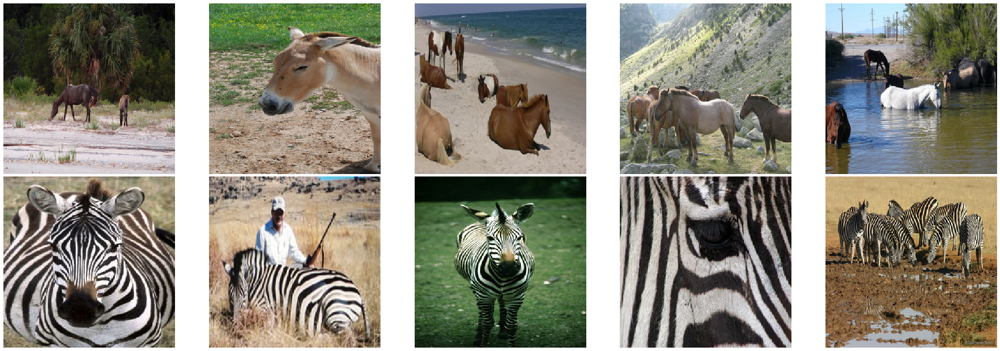

In [8]:
a = np.random.randint(1000)
fig = plt.figure(figsize=(30,10))
count = 1
for i in ["A/horse", "B/zebra"]:
    path = os.listdir(os.path.join(DATA_DIR, i))
    for f in path[a:a+5]:
        path1 = os.path.join(DATA_DIR, i,f)
        img = Image.open(path1)
        fig.add_subplot(2,5,count)
        plt.imshow(img)
        plt.axis("off")
        count+=1
fig.tight_layout(pad=0.5)   
plt.show()
        

In [9]:
class ImagePool():
    def __init__(self, pool_size):
        self.pool_size = pool_size
        if self.pool_size > 0:
            self.num_imgs = 0
            self.images = []

    def query(self, images):
        if self.pool_size == 0:
            return images
        return_images = []
        for image in images.data:
            image = torch.unsqueeze(image, 0)
            if self.num_imgs < self.pool_size:
                self.num_imgs = self.num_imgs + 1
                self.images.append(image)
                return_images.append(image)
            else:
                p = np.random.uniform(0, 1)
                if p > 0.5:
                    random_id = np.random.randint(0, self.pool_size-1)
                    tmp = self.images[random_id].clone()
                    self.images[random_id] = image
                    return_images.append(tmp)
                else:
                    return_images.append(image)
        return_images = Variable(torch.cat(return_images, 0))
        return return_images

In [12]:
class ResNetBlock(nn.Module):
    def __init__(self, n_features):
        super(ResNetBlock, self).__init__()
        self.resblock = nn.Sequential(
            nn.Conv2d(n_features,n_features, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(n_features),
            nn.ReLU(inplace=True),
            nn.Conv2d(n_features,n_features, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(n_features)
        )
    
    def forward(self, x):
        x = self.resblock(x) + x
        return x

In [13]:
class Generator(torch.nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        # encoder
        self.hidden0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=1, padding=3),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.hidden1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.hidden2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        
        # transformer
        num_res_blocks = 9
        conv_layers = [nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)]
        for i in range(num_res_blocks):
            conv_layers.append(ResNetBlock(256))
        self.res_blocks = nn.Sequential(*conv_layers)
        
        # decoder
        self.hidden3 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.hidden4 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.hidden5 = nn.Sequential(
            nn.ConvTranspose2d(64, 3, kernel_size=7, stride=1, padding=3), #padding=1?
            nn.Tanh()
        )
        
    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.res_blocks(x)
        x = self.hidden3(x)
        x = self.hidden4(x)
        x = self.hidden5(x)
        return x


In [14]:
class Discriminator(torch.nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.hidden0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.LeakyReLU(.2, inplace=True)
        )
        self.hidden1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(.2, inplace=True),
        )
        self.hidden2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(.2, inplace=True)
        )
        self.hidden3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(.2, inplace=True),
        )
        self.out = nn.Sequential(
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1)
        )
        
    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.hidden3(x)
        x = self.out(x)
        return x
        

In [15]:
def generate_labels(size, label):
    if label == 1:
        data = torch.ones(size) - 0.1
    elif label == 0:
        data = torch.zeros(size)
    data = Variable(data).to(device)
    return data

In [16]:
def train_generator(D_A,D_B,G_A2B,G_B2A,G_optimizer,error,cyclic_error,real_A, fake_A, real_B, fake_B):
    batch_size = real_A.size(0)
    G_optimizer.zero_grad()
    
    """ # Identity losses #
    replicate_B       = G_A2B(real_B)
    loss_identity_B   = cyclic_error(replicate_B, real_B) * 5
        
    replicate_A       = G_B2A(real_A)
    loss_identity_A   = cyclic_error(replicate_A, real_A) * 5"""
    
    # Transform losses #
    predict_fake_B = D_B(fake_B)
    loss_G_A = error(predict_fake_B,generate_labels(predict_fake_B.size(),1))
    
    predict_fake_A = D_A(fake_A)
    loss_G_B = error(predict_fake_A,generate_labels(predict_fake_A.size(),1))
    
    # Cycle losses #
    cyclic_A = G_B2A(fake_B)
    loss_cyclic_A = cyclic_error(real_A,cyclic_A) * 10
    
    cyclic_B = G_A2B(fake_A)
    loss_cyclic_B = cyclic_error(cyclic_B,real_B) *10
    
    # Total Losses #
    loss_G = loss_G_A + loss_G_B + loss_cyclic_A + loss_cyclic_B #+ loss_identity_A + loss_identity_B
    loss_G.backward()
    G_optimizer.step()
    
    return loss_G_A.data, loss_G_B.data, loss_cyclic_A.data, loss_cyclic_B.data

In [17]:
fake_A_pool = ImagePool(100)
fake_B_pool = ImagePool(100)

In [18]:
def train_discriminator(D_A,D_B,G_A2B,G_B2A,optimizer_A,optimizer_B,error,cyclic_error,real_A, fake_A, real_B, fake_B):
    batch_size = real_A.size(0)
    D_A.zero_grad()
    D_B.zero_grad()
    
    #Train Discriminator A
    predict_real_A = D_A(real_A)
    loss_real_A = error(predict_real_A,generate_labels(predict_real_A.size(),1))
    
    fake_A = fake_A_pool.query(fake_A)
    
    predict_fake_A = D_A(fake_A)
    loss_fake_A = error(predict_fake_A,generate_labels(predict_fake_A.size(),0))
    
    loss_D_A = (loss_real_A +loss_fake_A)*5
    loss_D_A.backward()
    optimizer_A.step()
    
    #Train Discriminator B
    predict_real_B = D_B(real_B)
    loss_real_B = error(predict_real_B,generate_labels(predict_real_B.size(),1))
    
    fake_B = fake_B_pool.query(fake_B)
    
    predict_fake_B = D_B(fake_B)
    loss_fake_B = error(predict_fake_B,generate_labels(predict_fake_B.size(),0))
    
    loss_D_B = (loss_real_B +loss_fake_B)*5
    loss_D_B.backward()
    optimizer_B.step()
    
    return loss_D_A.data, loss_D_B.data
    
    

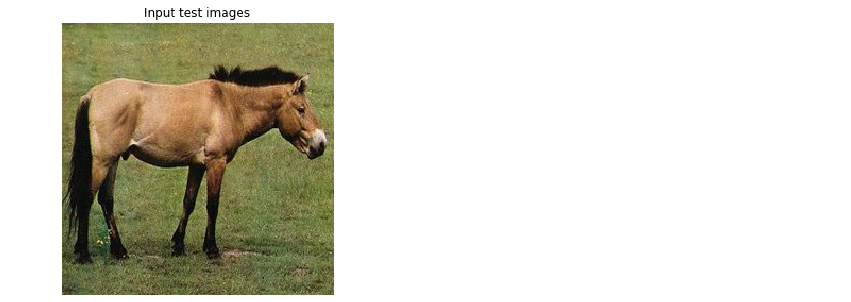

In [19]:
fixed_img_A = Image.open("data/test/testA/n02381460_3330.jpg")

fig = plt.figure(figsize=(15,5))
plt.axis("off")
fig.add_subplot(1,2,1)
plt.axis("off")
plt.title("Input test images")
plt.imshow(fixed_img_A)

plt.show()



In [20]:
def imshow(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_show = img.cpu().numpy().squeeze().transpose((1,2,0))
    img_show = (img_show * std+mean)
    img_show = np.clip(img_show,0,1)
    return img_show

In [21]:
def generate_img(G_A2B, G_B2A, img, domain):
    G_A2B.eval()
    G_B2A.eval()
        
    img = Variable(data_transform(img)).view(-1,3,IMG_SIZE,IMG_SIZE).to(device)
    with torch.no_grad():
        img_show = imshow(img)
        if domain == "A":
            fake = G_A2B(img)
            fake_show = imshow(fake)
            reconstructed = G_B2A(fake)
            reconstructed_show = imshow(reconstructed)
        else:
            fake = G_B2A(img)
            fake_show = imshow(fake)
            reconstructed = G_A2B(fake)
            reconstructed_show = imshow(reconstructed)


    fig = plt.figure(figsize=(30,10))
    plt.title("Generator test")
    plt.axis("off")
    fig.add_subplot(1,3,1)
    plt.axis("off")
    plt.title("Real")
    plt.imshow(img_show)
    fig.add_subplot(1,3,2)
    plt.axis("off")
    plt.title("Generated")
    plt.imshow(fake_show)
    fig.add_subplot(1,3,3)
    plt.axis("off")
    plt.title("Reconstructed")
    plt.imshow(reconstructed_show)
    plt.show()
    
    G_A2B.train()
    G_B2A.train()

In [23]:
# input_dim, num_filter, output_dim, num_resnet

G_A2B = Generator().to(device)
G_B2A = Generator().to(device)
#generate_img(G_A2B,G_B2A,transform_A)
def train(dataloader_A, dataloader_B):
    
    # input_dim, num_filter, output_dim
    D_A = Discriminator().to(device)
    D_B = Discriminator().to(device)

    """G_A2B.normal_weight_init(mean=0.0, std=0.02)
    G_B2A.normal_weight_init(mean=0.0, std=0.02)
    D_A.normal_weight_init(mean=0.0, std=0.02)
    D_B.normal_weight_init(mean=0.0, std=0.02)"""

    
    G_optimizer = torch.optim.Adam(
        itertools.chain(G_A2B.parameters(), G_B2A.parameters()), lr=0.0002,betas=(0.5, 0.999))
    D_A_optimizer = torch.optim.Adam(
        D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
    D_B_optimizer = torch.optim.Adam(
        D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

    MSE_error = nn.MSELoss()
    L1_error = nn.L1Loss()

    D_A_loss_list = []
    D_B_loss_list = []
    G_A_loss_list = []
    G_B_loss_list = []
    Cyclic_A_loss_list = []
    Cyclic_B_loss_list = []

    EPOCHS = 70

    print("Start training...")
    for epoch in range(EPOCHS):
        for i, (batch_A, batch_B) in enumerate(zip(dataloader_A, dataloader_B)):
            real_A = batch_A[0].to(device)
            real_B = batch_B[0].to(device)
            fake_A = G_B2A(real_B)
            fake_B = G_A2B(real_A)
            loss_G_A, loss_G_B, loss_cyclic_A, loss_cyclic_B = train_generator(D_A, D_B, G_A2B, G_B2A, G_optimizer,
                                                                               MSE_error, L1_error, real_A, fake_A, real_B, fake_B)
            loss_D_A, loss_D_B = train_discriminator(D_A, D_B, G_A2B, G_B2A, D_A_optimizer, D_B_optimizer, MSE_error, L1_error, real_A,
                                                     fake_A, real_B, fake_B)

            D_A_loss_list.append(loss_D_A)
            D_B_loss_list.append(loss_D_B)
            G_A_loss_list.append(loss_G_A)
            G_B_loss_list.append(loss_G_B)
            Cyclic_A_loss_list.append(loss_cyclic_A)
            Cyclic_B_loss_list.append(loss_cyclic_B)

            if i % 360 == 0 or i == len(dataloader_A)-1:
                print("Epoch: ({}/{}) | Batch: ({}/{}) | D_A_Loss: {:.4f} D_B_Loss: {:.4f} | G_A_Loss: {:.4f} G_B_Loss: {:.4f} | C_A_Loss: {:.4f} C_B_Loss: {:.4f} |".format(
                    epoch+1, EPOCHS, i+1, len(dataloader_A), loss_D_A, loss_D_B, loss_G_A, loss_G_B, loss_cyclic_A, loss_cyclic_B))
        
        if epoch%3==0 or epoch == EPOCHS-1:
            ga_name = "model/generatorA-{}.pth".format(epoch)
            gb_name = "model/generatorB-{}.pth".format(epoch)
            torch.save(G_A2B.state_dict(), ga_name)
            torch.save(G_B2A.state_dict(), gb_name)
            generate_img(G_A2B, G_B2A, fixed_img_A, "A")
            
        if(epoch>50) :
            D_A_optimizer.param_groups[0]['lr'] -= (0.0002 / 20)
            D_B_optimizer.param_groups[0]['lr'] -= (0.0002 / 20)
            G_optimizer.param_groups[0]['lr'] -= (0.0002 / 20)
            print("Learning rate decay to {}".format(G_optimizer.param_groups[0]['lr']))
        
    print("Training Completed!")
    return G_A2B, G_B2A, D_A_loss_list, D_B_loss_list, G_A_loss_list, G_B_loss_list, Cyclic_A_loss_list, Cyclic_B_loss_list

Start training...
Epoch: (1/70) | Batch: (1/1067) | D_A_Loss: 4.5078 D_B_Loss: 5.1444 | G_A_Loss: 0.8680 G_B_Loss: 0.7594 | C_A_Loss: 10.0967 C_B_Loss: 16.0986 |
Epoch: (1/70) | Batch: (361/1067) | D_A_Loss: 1.5521 D_B_Loss: 1.7147 | G_A_Loss: 0.3199 G_B_Loss: 0.3534 | C_A_Loss: 7.0021 C_B_Loss: 6.2615 |
Epoch: (1/70) | Batch: (721/1067) | D_A_Loss: 0.5406 D_B_Loss: 0.3155 | G_A_Loss: 0.6957 G_B_Loss: 0.5372 | C_A_Loss: 5.6908 C_B_Loss: 7.1297 |
Epoch: (1/70) | Batch: (1067/1067) | D_A_Loss: 0.7279 D_B_Loss: 0.3252 | G_A_Loss: 0.6029 G_B_Loss: 0.4091 | C_A_Loss: 3.5571 C_B_Loss: 6.6624 |


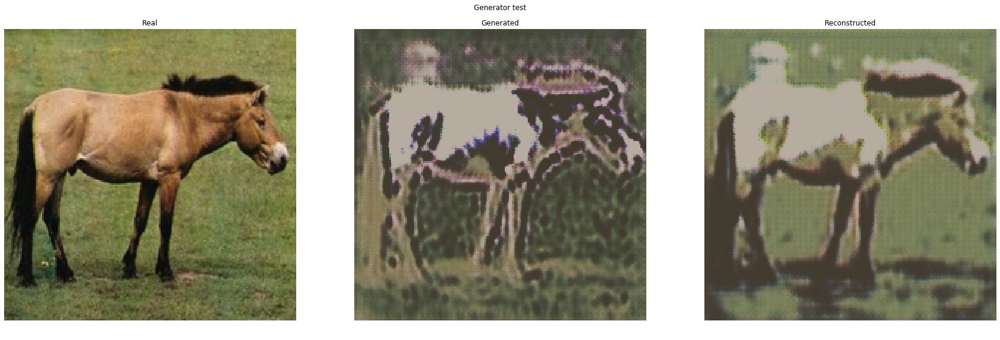

Epoch: (2/70) | Batch: (1/1067) | D_A_Loss: 1.2176 D_B_Loss: 0.2556 | G_A_Loss: 0.5100 G_B_Loss: 0.7991 | C_A_Loss: 3.3662 C_B_Loss: 8.0472 |
Epoch: (2/70) | Batch: (361/1067) | D_A_Loss: 0.4136 D_B_Loss: 0.6859 | G_A_Loss: 0.2386 G_B_Loss: 0.5351 | C_A_Loss: 6.0644 C_B_Loss: 7.2354 |
Epoch: (2/70) | Batch: (721/1067) | D_A_Loss: 1.0696 D_B_Loss: 0.8572 | G_A_Loss: 0.7416 G_B_Loss: 0.2137 | C_A_Loss: 8.9465 C_B_Loss: 4.8397 |
Epoch: (2/70) | Batch: (1067/1067) | D_A_Loss: 1.3709 D_B_Loss: 0.4789 | G_A_Loss: 0.4951 G_B_Loss: 0.7860 | C_A_Loss: 4.5742 C_B_Loss: 5.0885 |
Epoch: (3/70) | Batch: (1/1067) | D_A_Loss: 0.2189 D_B_Loss: 0.2999 | G_A_Loss: 0.5167 G_B_Loss: 0.4187 | C_A_Loss: 5.2714 C_B_Loss: 5.0266 |
Epoch: (3/70) | Batch: (361/1067) | D_A_Loss: 0.1394 D_B_Loss: 0.7618 | G_A_Loss: 0.4854 G_B_Loss: 0.6889 | C_A_Loss: 6.4510 C_B_Loss: 5.5256 |
Epoch: (3/70) | Batch: (721/1067) | D_A_Loss: 0.1262 D_B_Loss: 0.5249 | G_A_Loss: 0.4995 G_B_Loss: 0.3417 | C_A_Loss: 7.0369 C_B_Loss: 6.00

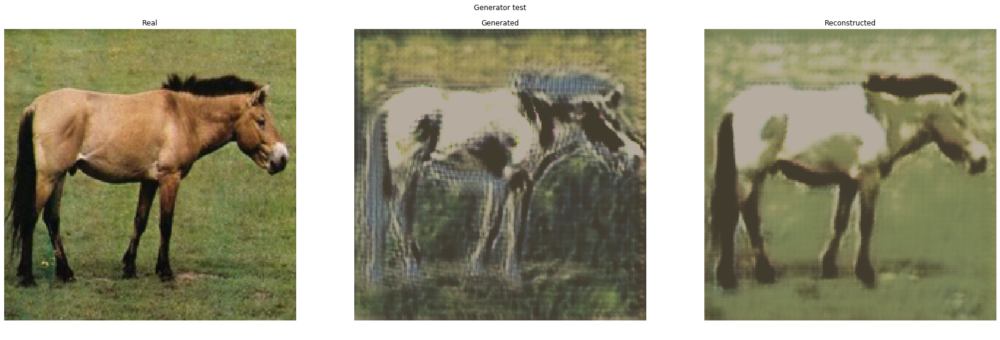

Epoch: (5/70) | Batch: (1/1067) | D_A_Loss: 0.3588 D_B_Loss: 0.4097 | G_A_Loss: 0.4432 G_B_Loss: 0.3361 | C_A_Loss: 5.6047 C_B_Loss: 4.6849 |
Epoch: (5/70) | Batch: (361/1067) | D_A_Loss: 0.5538 D_B_Loss: 0.1675 | G_A_Loss: 0.7666 G_B_Loss: 0.9917 | C_A_Loss: 3.4547 C_B_Loss: 5.2167 |
Epoch: (5/70) | Batch: (721/1067) | D_A_Loss: 0.6478 D_B_Loss: 0.3474 | G_A_Loss: 0.3584 G_B_Loss: 0.0527 | C_A_Loss: 2.8807 C_B_Loss: 6.8112 |
Epoch: (5/70) | Batch: (1067/1067) | D_A_Loss: 0.7759 D_B_Loss: 0.3709 | G_A_Loss: 0.5157 G_B_Loss: 0.3485 | C_A_Loss: 4.7455 C_B_Loss: 10.6021 |
Epoch: (6/70) | Batch: (1/1067) | D_A_Loss: 0.3726 D_B_Loss: 0.5449 | G_A_Loss: 0.8055 G_B_Loss: 0.6309 | C_A_Loss: 3.1971 C_B_Loss: 4.7936 |
Epoch: (6/70) | Batch: (361/1067) | D_A_Loss: 2.0523 D_B_Loss: 0.3444 | G_A_Loss: 0.4825 G_B_Loss: 0.6243 | C_A_Loss: 2.5218 C_B_Loss: 5.2129 |
Epoch: (6/70) | Batch: (721/1067) | D_A_Loss: 2.2000 D_B_Loss: 0.9187 | G_A_Loss: 0.5092 G_B_Loss: 0.4800 | C_A_Loss: 3.5134 C_B_Loss: 5.5

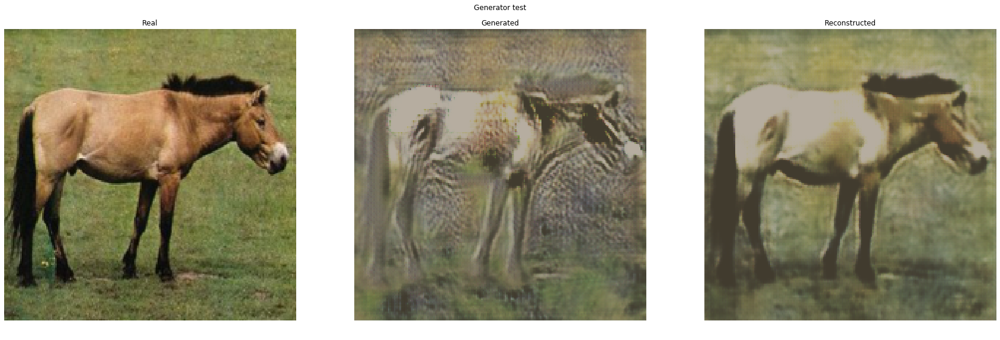

Epoch: (8/70) | Batch: (1/1067) | D_A_Loss: 0.6075 D_B_Loss: 0.3890 | G_A_Loss: 0.5701 G_B_Loss: 0.3808 | C_A_Loss: 5.0324 C_B_Loss: 5.6603 |
Epoch: (8/70) | Batch: (361/1067) | D_A_Loss: 0.3368 D_B_Loss: 0.2713 | G_A_Loss: 0.5415 G_B_Loss: 0.1785 | C_A_Loss: 3.5552 C_B_Loss: 3.4067 |
Epoch: (8/70) | Batch: (721/1067) | D_A_Loss: 1.1756 D_B_Loss: 1.1556 | G_A_Loss: 0.7485 G_B_Loss: 0.3653 | C_A_Loss: 7.6871 C_B_Loss: 4.6771 |
Epoch: (8/70) | Batch: (1067/1067) | D_A_Loss: 0.6261 D_B_Loss: 1.6790 | G_A_Loss: 0.1538 G_B_Loss: 0.4172 | C_A_Loss: 4.0889 C_B_Loss: 3.9957 |
Epoch: (9/70) | Batch: (1/1067) | D_A_Loss: 2.4746 D_B_Loss: 1.3329 | G_A_Loss: 0.3653 G_B_Loss: 0.0492 | C_A_Loss: 2.6441 C_B_Loss: 3.9611 |
Epoch: (9/70) | Batch: (361/1067) | D_A_Loss: 2.2517 D_B_Loss: 0.4233 | G_A_Loss: 0.4390 G_B_Loss: 0.1102 | C_A_Loss: 4.4103 C_B_Loss: 3.9930 |
Epoch: (9/70) | Batch: (721/1067) | D_A_Loss: 1.6304 D_B_Loss: 0.1753 | G_A_Loss: 0.4660 G_B_Loss: 0.3191 | C_A_Loss: 3.5926 C_B_Loss: 8.01

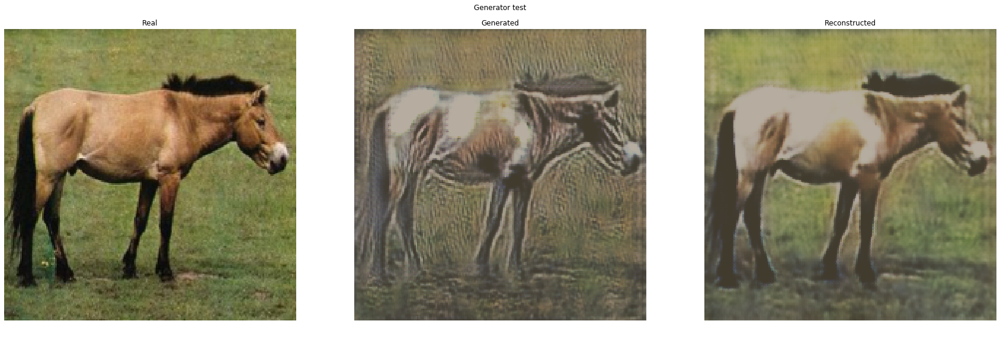

Epoch: (11/70) | Batch: (1/1067) | D_A_Loss: 0.3967 D_B_Loss: 0.5821 | G_A_Loss: 0.4416 G_B_Loss: 0.4629 | C_A_Loss: 2.9558 C_B_Loss: 3.8632 |
Epoch: (11/70) | Batch: (361/1067) | D_A_Loss: 0.4053 D_B_Loss: 0.2652 | G_A_Loss: 1.0667 G_B_Loss: 0.4756 | C_A_Loss: 4.6578 C_B_Loss: 5.0045 |
Epoch: (11/70) | Batch: (721/1067) | D_A_Loss: 1.0861 D_B_Loss: 2.9853 | G_A_Loss: 0.4189 G_B_Loss: 0.2350 | C_A_Loss: 3.8533 C_B_Loss: 6.5121 |
Epoch: (11/70) | Batch: (1067/1067) | D_A_Loss: 0.5919 D_B_Loss: 0.7123 | G_A_Loss: 0.3290 G_B_Loss: 0.2041 | C_A_Loss: 6.6058 C_B_Loss: 4.3207 |
Epoch: (12/70) | Batch: (1/1067) | D_A_Loss: 2.9447 D_B_Loss: 3.1123 | G_A_Loss: 0.4235 G_B_Loss: 0.0485 | C_A_Loss: 2.9285 C_B_Loss: 3.6134 |
Epoch: (12/70) | Batch: (361/1067) | D_A_Loss: 0.2918 D_B_Loss: 0.1757 | G_A_Loss: 0.2342 G_B_Loss: 0.2850 | C_A_Loss: 4.1629 C_B_Loss: 3.9396 |
Epoch: (12/70) | Batch: (721/1067) | D_A_Loss: 0.7123 D_B_Loss: 1.4367 | G_A_Loss: 0.8349 G_B_Loss: 0.3737 | C_A_Loss: 2.3643 C_B_Los

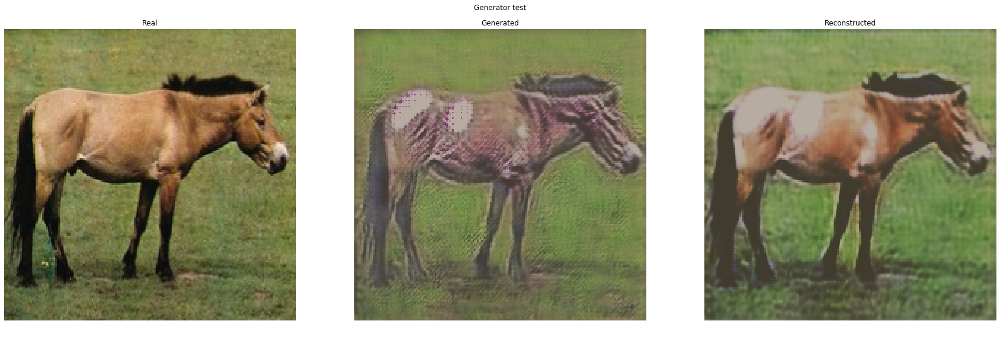

Epoch: (14/70) | Batch: (1/1067) | D_A_Loss: 0.3905 D_B_Loss: 0.5290 | G_A_Loss: 0.4964 G_B_Loss: 0.4630 | C_A_Loss: 4.8043 C_B_Loss: 2.1866 |
Epoch: (14/70) | Batch: (361/1067) | D_A_Loss: 0.7472 D_B_Loss: 0.1140 | G_A_Loss: 0.5408 G_B_Loss: 0.5059 | C_A_Loss: 2.4263 C_B_Loss: 5.7595 |
Epoch: (14/70) | Batch: (721/1067) | D_A_Loss: 1.1880 D_B_Loss: 0.4237 | G_A_Loss: 0.1364 G_B_Loss: 0.4446 | C_A_Loss: 2.5353 C_B_Loss: 4.2110 |
Epoch: (14/70) | Batch: (1067/1067) | D_A_Loss: 0.3579 D_B_Loss: 0.6527 | G_A_Loss: 0.3474 G_B_Loss: 0.3385 | C_A_Loss: 3.5350 C_B_Loss: 4.6644 |
Epoch: (15/70) | Batch: (1/1067) | D_A_Loss: 0.9610 D_B_Loss: 2.0386 | G_A_Loss: 0.1164 G_B_Loss: 0.2779 | C_A_Loss: 9.0551 C_B_Loss: 2.5681 |
Epoch: (15/70) | Batch: (361/1067) | D_A_Loss: 2.2294 D_B_Loss: 1.8128 | G_A_Loss: 0.5250 G_B_Loss: 0.0977 | C_A_Loss: 5.2392 C_B_Loss: 3.2099 |
Epoch: (15/70) | Batch: (721/1067) | D_A_Loss: 0.3083 D_B_Loss: 2.3313 | G_A_Loss: 0.1842 G_B_Loss: 0.5626 | C_A_Loss: 2.5855 C_B_Los

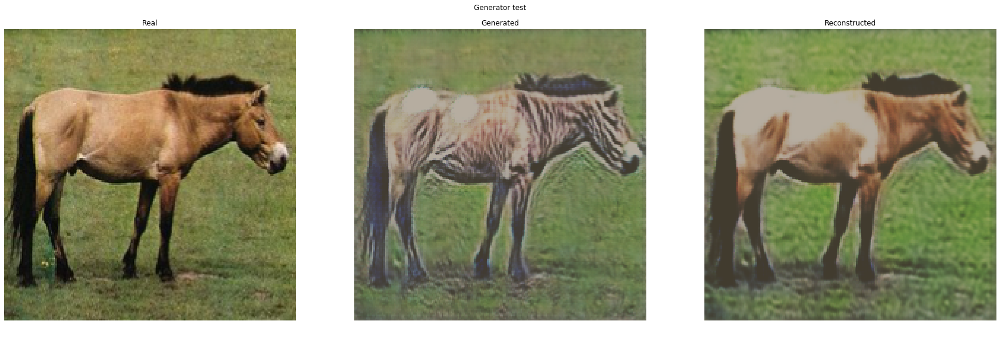

Epoch: (17/70) | Batch: (1/1067) | D_A_Loss: 0.2987 D_B_Loss: 0.3629 | G_A_Loss: 0.8298 G_B_Loss: 0.6777 | C_A_Loss: 3.0532 C_B_Loss: 2.5636 |
Epoch: (17/70) | Batch: (361/1067) | D_A_Loss: 0.8291 D_B_Loss: 0.6124 | G_A_Loss: 0.2163 G_B_Loss: 0.4965 | C_A_Loss: 5.2044 C_B_Loss: 3.7867 |
Epoch: (17/70) | Batch: (721/1067) | D_A_Loss: 0.9078 D_B_Loss: 0.2987 | G_A_Loss: 0.5796 G_B_Loss: 0.3549 | C_A_Loss: 2.8061 C_B_Loss: 3.4932 |
Epoch: (17/70) | Batch: (1067/1067) | D_A_Loss: 0.1359 D_B_Loss: 1.0424 | G_A_Loss: 0.2410 G_B_Loss: 0.3605 | C_A_Loss: 4.2295 C_B_Loss: 3.0050 |
Epoch: (18/70) | Batch: (1/1067) | D_A_Loss: 0.9190 D_B_Loss: 0.6529 | G_A_Loss: 0.5729 G_B_Loss: 0.3495 | C_A_Loss: 3.5829 C_B_Loss: 2.4880 |
Epoch: (18/70) | Batch: (361/1067) | D_A_Loss: 0.6923 D_B_Loss: 0.5210 | G_A_Loss: 0.4100 G_B_Loss: 0.6414 | C_A_Loss: 5.0132 C_B_Loss: 3.3138 |
Epoch: (18/70) | Batch: (721/1067) | D_A_Loss: 0.5821 D_B_Loss: 0.6934 | G_A_Loss: 0.3457 G_B_Loss: 0.5267 | C_A_Loss: 3.7093 C_B_Los

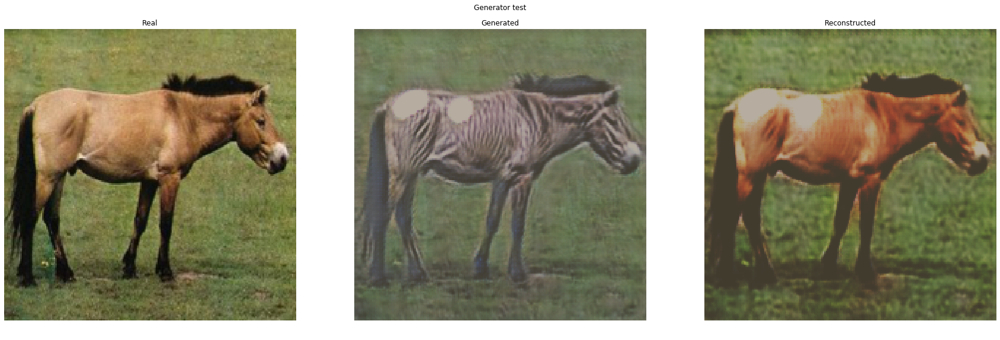

Epoch: (20/70) | Batch: (1/1067) | D_A_Loss: 1.1982 D_B_Loss: 2.9012 | G_A_Loss: 0.0571 G_B_Loss: 0.3418 | C_A_Loss: 4.7561 C_B_Loss: 3.0233 |
Epoch: (20/70) | Batch: (361/1067) | D_A_Loss: 1.4729 D_B_Loss: 0.1781 | G_A_Loss: 0.3064 G_B_Loss: 0.1710 | C_A_Loss: 1.7298 C_B_Loss: 2.8127 |
Epoch: (20/70) | Batch: (721/1067) | D_A_Loss: 0.8637 D_B_Loss: 0.2253 | G_A_Loss: 0.5718 G_B_Loss: 0.0729 | C_A_Loss: 1.9990 C_B_Loss: 3.5654 |
Epoch: (20/70) | Batch: (1067/1067) | D_A_Loss: 2.5111 D_B_Loss: 1.2438 | G_A_Loss: 0.2613 G_B_Loss: 0.0659 | C_A_Loss: 3.1968 C_B_Loss: 3.3126 |
Epoch: (21/70) | Batch: (1/1067) | D_A_Loss: 0.4606 D_B_Loss: 0.7594 | G_A_Loss: 0.0985 G_B_Loss: 0.6114 | C_A_Loss: 3.3975 C_B_Loss: 5.5544 |
Epoch: (21/70) | Batch: (361/1067) | D_A_Loss: 0.8440 D_B_Loss: 0.2854 | G_A_Loss: 0.6292 G_B_Loss: 0.3311 | C_A_Loss: 5.5438 C_B_Loss: 3.5941 |
Epoch: (21/70) | Batch: (721/1067) | D_A_Loss: 1.4196 D_B_Loss: 0.5867 | G_A_Loss: 0.7051 G_B_Loss: 0.5099 | C_A_Loss: 4.1540 C_B_Los

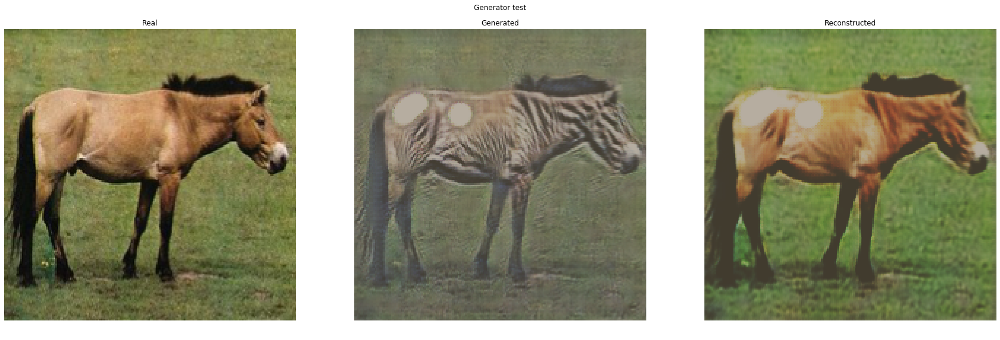

Epoch: (23/70) | Batch: (1/1067) | D_A_Loss: 2.7764 D_B_Loss: 0.9264 | G_A_Loss: 0.3348 G_B_Loss: 0.0940 | C_A_Loss: 4.1756 C_B_Loss: 2.1933 |
Epoch: (23/70) | Batch: (361/1067) | D_A_Loss: 0.2195 D_B_Loss: 1.4815 | G_A_Loss: 0.4585 G_B_Loss: 0.2151 | C_A_Loss: 1.5287 C_B_Loss: 4.9370 |
Epoch: (23/70) | Batch: (721/1067) | D_A_Loss: 2.2570 D_B_Loss: 0.3793 | G_A_Loss: 0.4402 G_B_Loss: 0.7205 | C_A_Loss: 3.6703 C_B_Loss: 2.4597 |
Epoch: (23/70) | Batch: (1067/1067) | D_A_Loss: 1.8823 D_B_Loss: 0.4737 | G_A_Loss: 0.8055 G_B_Loss: 0.2163 | C_A_Loss: 4.8321 C_B_Loss: 2.0673 |
Epoch: (24/70) | Batch: (1/1067) | D_A_Loss: 1.3646 D_B_Loss: 0.6751 | G_A_Loss: 0.6948 G_B_Loss: 0.3500 | C_A_Loss: 2.0309 C_B_Loss: 3.1278 |
Epoch: (24/70) | Batch: (361/1067) | D_A_Loss: 0.3779 D_B_Loss: 2.2544 | G_A_Loss: 0.6756 G_B_Loss: 0.2587 | C_A_Loss: 5.9048 C_B_Loss: 5.0772 |
Epoch: (24/70) | Batch: (721/1067) | D_A_Loss: 0.1871 D_B_Loss: 0.7064 | G_A_Loss: 0.4087 G_B_Loss: 0.2256 | C_A_Loss: 2.8607 C_B_Los

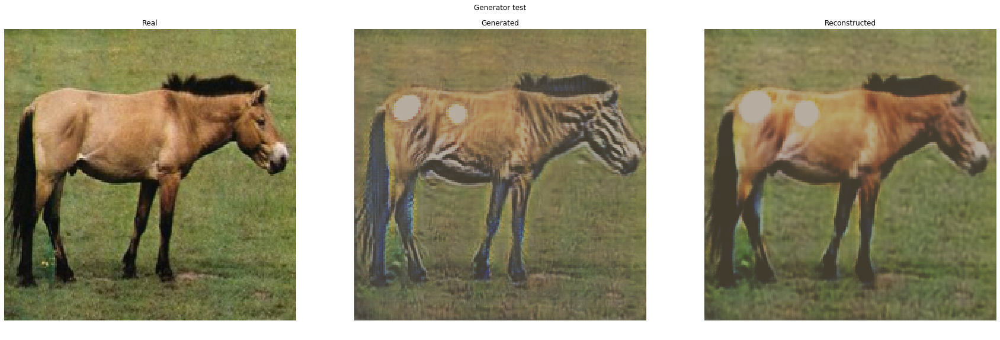

Epoch: (26/70) | Batch: (1/1067) | D_A_Loss: 3.1202 D_B_Loss: 0.7288 | G_A_Loss: 0.3666 G_B_Loss: 0.4253 | C_A_Loss: 3.4689 C_B_Loss: 4.8274 |
Epoch: (26/70) | Batch: (361/1067) | D_A_Loss: 0.2015 D_B_Loss: 0.2389 | G_A_Loss: 0.5942 G_B_Loss: 0.4291 | C_A_Loss: 4.0624 C_B_Loss: 3.3795 |
Epoch: (26/70) | Batch: (721/1067) | D_A_Loss: 1.5023 D_B_Loss: 2.4289 | G_A_Loss: 0.1061 G_B_Loss: 0.3637 | C_A_Loss: 4.0302 C_B_Loss: 3.2773 |
Epoch: (26/70) | Batch: (1067/1067) | D_A_Loss: 1.8778 D_B_Loss: 0.5650 | G_A_Loss: 0.4447 G_B_Loss: 0.1300 | C_A_Loss: 2.8601 C_B_Loss: 4.4395 |
Epoch: (27/70) | Batch: (1/1067) | D_A_Loss: 0.1491 D_B_Loss: 0.3127 | G_A_Loss: 0.5819 G_B_Loss: 0.3000 | C_A_Loss: 3.8185 C_B_Loss: 3.4321 |
Epoch: (27/70) | Batch: (361/1067) | D_A_Loss: 0.9010 D_B_Loss: 1.2083 | G_A_Loss: 0.2176 G_B_Loss: 0.3422 | C_A_Loss: 4.9992 C_B_Loss: 2.9502 |
Epoch: (27/70) | Batch: (721/1067) | D_A_Loss: 1.1322 D_B_Loss: 0.3478 | G_A_Loss: 0.6255 G_B_Loss: 0.2590 | C_A_Loss: 3.2059 C_B_Los

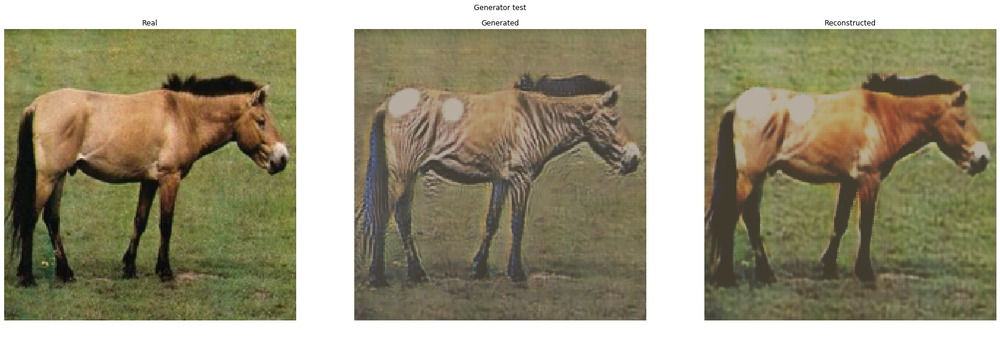

Epoch: (29/70) | Batch: (1/1067) | D_A_Loss: 1.1022 D_B_Loss: 0.4289 | G_A_Loss: 0.6583 G_B_Loss: 0.2353 | C_A_Loss: 3.4544 C_B_Loss: 3.9284 |
Epoch: (29/70) | Batch: (361/1067) | D_A_Loss: 0.4690 D_B_Loss: 0.8853 | G_A_Loss: 0.1937 G_B_Loss: 0.3119 | C_A_Loss: 4.2553 C_B_Loss: 2.3402 |
Epoch: (29/70) | Batch: (721/1067) | D_A_Loss: 2.7855 D_B_Loss: 0.3906 | G_A_Loss: 0.6219 G_B_Loss: 0.1966 | C_A_Loss: 4.0548 C_B_Loss: 2.1633 |
Epoch: (29/70) | Batch: (1067/1067) | D_A_Loss: 0.6156 D_B_Loss: 0.8500 | G_A_Loss: 0.3280 G_B_Loss: 0.4291 | C_A_Loss: 3.6858 C_B_Loss: 4.5547 |
Epoch: (30/70) | Batch: (1/1067) | D_A_Loss: 1.7098 D_B_Loss: 0.6522 | G_A_Loss: 0.4932 G_B_Loss: 0.4815 | C_A_Loss: 1.9650 C_B_Loss: 3.4065 |
Epoch: (30/70) | Batch: (361/1067) | D_A_Loss: 1.3891 D_B_Loss: 2.0030 | G_A_Loss: 0.6466 G_B_Loss: 0.2695 | C_A_Loss: 4.1124 C_B_Loss: 2.6427 |
Epoch: (30/70) | Batch: (721/1067) | D_A_Loss: 1.3735 D_B_Loss: 0.9292 | G_A_Loss: 0.2822 G_B_Loss: 0.7379 | C_A_Loss: 1.4612 C_B_Los

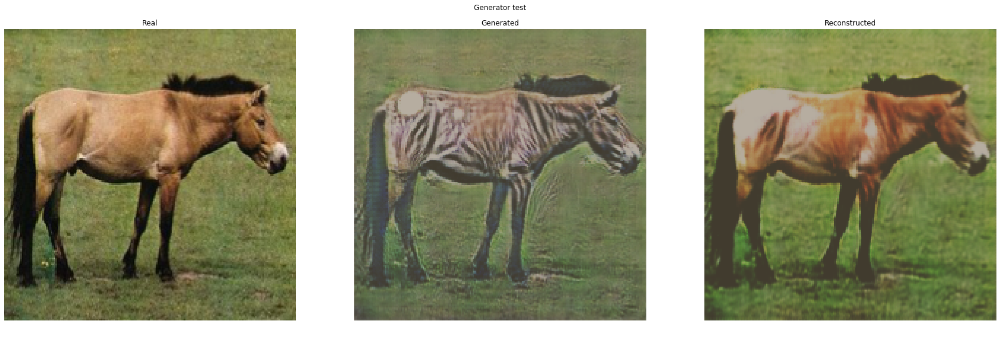

Epoch: (32/70) | Batch: (1/1067) | D_A_Loss: 0.1702 D_B_Loss: 0.6535 | G_A_Loss: 0.5967 G_B_Loss: 0.8308 | C_A_Loss: 1.2205 C_B_Loss: 3.2281 |
Epoch: (32/70) | Batch: (361/1067) | D_A_Loss: 1.4950 D_B_Loss: 0.8778 | G_A_Loss: 0.4432 G_B_Loss: 0.1835 | C_A_Loss: 3.4060 C_B_Loss: 2.4501 |
Epoch: (32/70) | Batch: (721/1067) | D_A_Loss: 1.3137 D_B_Loss: 0.5638 | G_A_Loss: 0.3611 G_B_Loss: 0.4459 | C_A_Loss: 2.8071 C_B_Loss: 5.5921 |
Epoch: (32/70) | Batch: (1067/1067) | D_A_Loss: 0.7686 D_B_Loss: 1.0886 | G_A_Loss: 0.8747 G_B_Loss: 0.4315 | C_A_Loss: 3.0289 C_B_Loss: 4.3955 |
Epoch: (33/70) | Batch: (1/1067) | D_A_Loss: 2.5114 D_B_Loss: 0.3479 | G_A_Loss: 0.3397 G_B_Loss: 0.4180 | C_A_Loss: 1.9738 C_B_Loss: 2.3014 |
Epoch: (33/70) | Batch: (361/1067) | D_A_Loss: 0.2351 D_B_Loss: 0.5767 | G_A_Loss: 0.6150 G_B_Loss: 0.5726 | C_A_Loss: 4.9597 C_B_Loss: 3.1810 |
Epoch: (33/70) | Batch: (721/1067) | D_A_Loss: 0.3218 D_B_Loss: 0.2596 | G_A_Loss: 0.3705 G_B_Loss: 0.3904 | C_A_Loss: 2.1337 C_B_Los

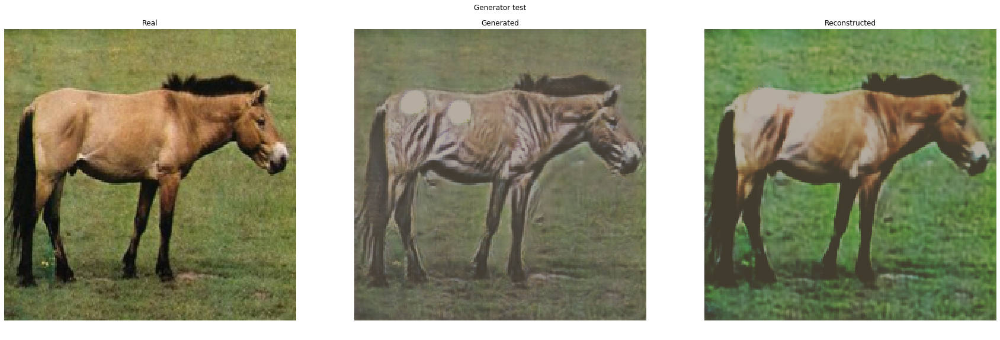

Epoch: (35/70) | Batch: (1/1067) | D_A_Loss: 0.3760 D_B_Loss: 0.4936 | G_A_Loss: 0.6582 G_B_Loss: 0.5769 | C_A_Loss: 2.5127 C_B_Loss: 3.4403 |
Epoch: (35/70) | Batch: (361/1067) | D_A_Loss: 0.8572 D_B_Loss: 0.6223 | G_A_Loss: 0.4419 G_B_Loss: 0.3432 | C_A_Loss: 4.9675 C_B_Loss: 4.2394 |
Epoch: (35/70) | Batch: (721/1067) | D_A_Loss: 1.1523 D_B_Loss: 0.7978 | G_A_Loss: 0.3664 G_B_Loss: 0.2771 | C_A_Loss: 2.7855 C_B_Loss: 4.8483 |
Epoch: (35/70) | Batch: (1067/1067) | D_A_Loss: 0.4671 D_B_Loss: 0.1892 | G_A_Loss: 0.8730 G_B_Loss: 0.2579 | C_A_Loss: 1.8251 C_B_Loss: 1.9917 |
Epoch: (36/70) | Batch: (1/1067) | D_A_Loss: 0.5187 D_B_Loss: 0.9729 | G_A_Loss: 0.9876 G_B_Loss: 0.1396 | C_A_Loss: 3.6475 C_B_Loss: 2.5587 |
Epoch: (36/70) | Batch: (361/1067) | D_A_Loss: 0.6672 D_B_Loss: 0.3499 | G_A_Loss: 0.6171 G_B_Loss: 0.6279 | C_A_Loss: 5.4132 C_B_Loss: 4.8304 |
Epoch: (36/70) | Batch: (721/1067) | D_A_Loss: 1.5732 D_B_Loss: 0.5782 | G_A_Loss: 0.5700 G_B_Loss: 0.1564 | C_A_Loss: 3.5319 C_B_Los

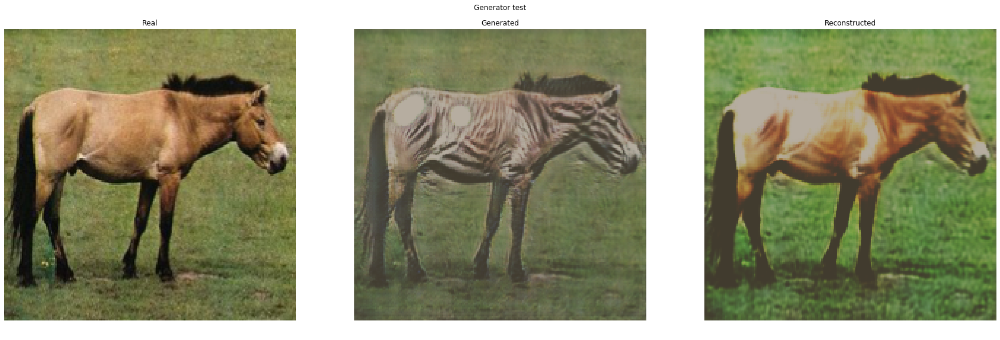

Epoch: (38/70) | Batch: (1/1067) | D_A_Loss: 1.0981 D_B_Loss: 1.0654 | G_A_Loss: 0.7020 G_B_Loss: 0.2546 | C_A_Loss: 1.4934 C_B_Loss: 5.6592 |
Epoch: (38/70) | Batch: (361/1067) | D_A_Loss: 0.4701 D_B_Loss: 0.7716 | G_A_Loss: 0.1928 G_B_Loss: 0.3840 | C_A_Loss: 1.4481 C_B_Loss: 3.6978 |
Epoch: (38/70) | Batch: (721/1067) | D_A_Loss: 0.8592 D_B_Loss: 1.5107 | G_A_Loss: 0.2569 G_B_Loss: 0.5207 | C_A_Loss: 4.0818 C_B_Loss: 2.8705 |
Epoch: (38/70) | Batch: (1067/1067) | D_A_Loss: 0.8459 D_B_Loss: 0.3406 | G_A_Loss: 0.5617 G_B_Loss: 0.8319 | C_A_Loss: 2.5599 C_B_Loss: 4.1274 |
Epoch: (39/70) | Batch: (1/1067) | D_A_Loss: 0.4367 D_B_Loss: 0.1872 | G_A_Loss: 1.0191 G_B_Loss: 0.5959 | C_A_Loss: 3.2545 C_B_Loss: 3.0820 |
Epoch: (39/70) | Batch: (361/1067) | D_A_Loss: 1.6658 D_B_Loss: 0.9092 | G_A_Loss: 0.2834 G_B_Loss: 0.5169 | C_A_Loss: 6.2271 C_B_Loss: 2.2522 |
Epoch: (39/70) | Batch: (721/1067) | D_A_Loss: 0.4209 D_B_Loss: 0.4619 | G_A_Loss: 0.6039 G_B_Loss: 0.3924 | C_A_Loss: 2.6718 C_B_Los

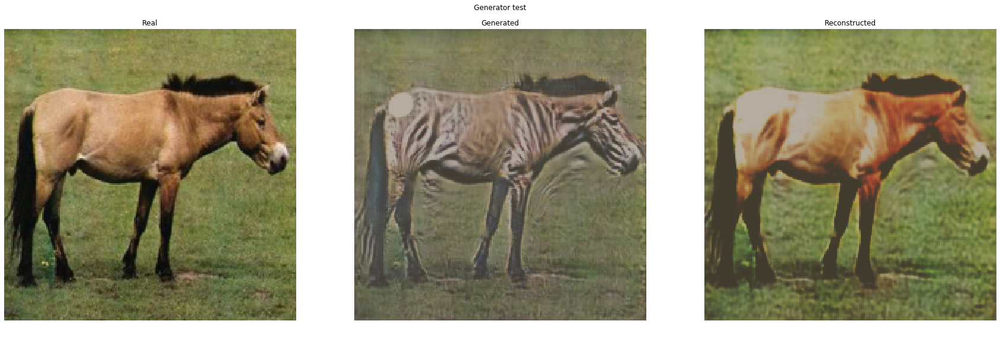

Epoch: (41/70) | Batch: (1/1067) | D_A_Loss: 0.7101 D_B_Loss: 0.8800 | G_A_Loss: 1.0644 G_B_Loss: 0.6339 | C_A_Loss: 2.1767 C_B_Loss: 4.6275 |
Epoch: (41/70) | Batch: (361/1067) | D_A_Loss: 1.9638 D_B_Loss: 2.0435 | G_A_Loss: 0.8781 G_B_Loss: 0.1071 | C_A_Loss: 2.9409 C_B_Loss: 3.3990 |
Epoch: (41/70) | Batch: (721/1067) | D_A_Loss: 1.3762 D_B_Loss: 1.7108 | G_A_Loss: 0.4279 G_B_Loss: 0.2355 | C_A_Loss: 2.2104 C_B_Loss: 2.5643 |
Epoch: (41/70) | Batch: (1067/1067) | D_A_Loss: 1.3914 D_B_Loss: 0.8417 | G_A_Loss: 0.9149 G_B_Loss: 0.2172 | C_A_Loss: 2.8476 C_B_Loss: 4.2404 |
Epoch: (42/70) | Batch: (1/1067) | D_A_Loss: 1.4193 D_B_Loss: 0.7907 | G_A_Loss: 0.4941 G_B_Loss: 0.2537 | C_A_Loss: 3.7029 C_B_Loss: 2.1031 |
Epoch: (42/70) | Batch: (361/1067) | D_A_Loss: 0.8279 D_B_Loss: 0.7351 | G_A_Loss: 0.6597 G_B_Loss: 0.3415 | C_A_Loss: 3.8010 C_B_Loss: 4.7397 |
Epoch: (42/70) | Batch: (721/1067) | D_A_Loss: 0.8105 D_B_Loss: 1.0970 | G_A_Loss: 0.3037 G_B_Loss: 0.5034 | C_A_Loss: 2.8673 C_B_Los

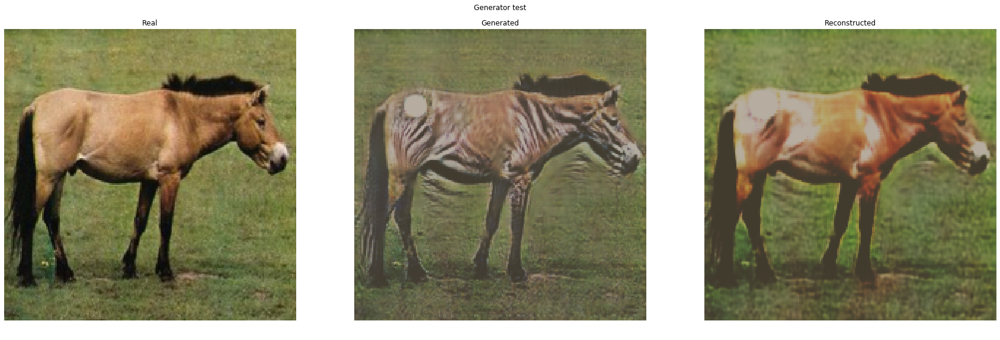

Epoch: (44/70) | Batch: (1/1067) | D_A_Loss: 1.4341 D_B_Loss: 0.4010 | G_A_Loss: 0.7183 G_B_Loss: 0.3720 | C_A_Loss: 3.7187 C_B_Loss: 3.0666 |
Epoch: (44/70) | Batch: (361/1067) | D_A_Loss: 0.3884 D_B_Loss: 2.0107 | G_A_Loss: 0.2369 G_B_Loss: 0.8471 | C_A_Loss: 3.7152 C_B_Loss: 2.7640 |
Epoch: (44/70) | Batch: (721/1067) | D_A_Loss: 0.3443 D_B_Loss: 0.6566 | G_A_Loss: 0.4442 G_B_Loss: 0.2995 | C_A_Loss: 3.9637 C_B_Loss: 3.4992 |
Epoch: (44/70) | Batch: (1067/1067) | D_A_Loss: 2.2891 D_B_Loss: 0.2694 | G_A_Loss: 0.2778 G_B_Loss: 0.1351 | C_A_Loss: 2.0607 C_B_Loss: 1.9288 |
Epoch: (45/70) | Batch: (1/1067) | D_A_Loss: 1.2551 D_B_Loss: 0.3423 | G_A_Loss: 0.1183 G_B_Loss: 0.9519 | C_A_Loss: 4.0369 C_B_Loss: 2.1368 |
Epoch: (45/70) | Batch: (361/1067) | D_A_Loss: 1.2108 D_B_Loss: 2.4485 | G_A_Loss: 0.6162 G_B_Loss: 0.2841 | C_A_Loss: 3.9573 C_B_Loss: 1.3725 |
Epoch: (45/70) | Batch: (721/1067) | D_A_Loss: 0.3625 D_B_Loss: 1.0871 | G_A_Loss: 0.2748 G_B_Loss: 0.4158 | C_A_Loss: 2.3287 C_B_Los

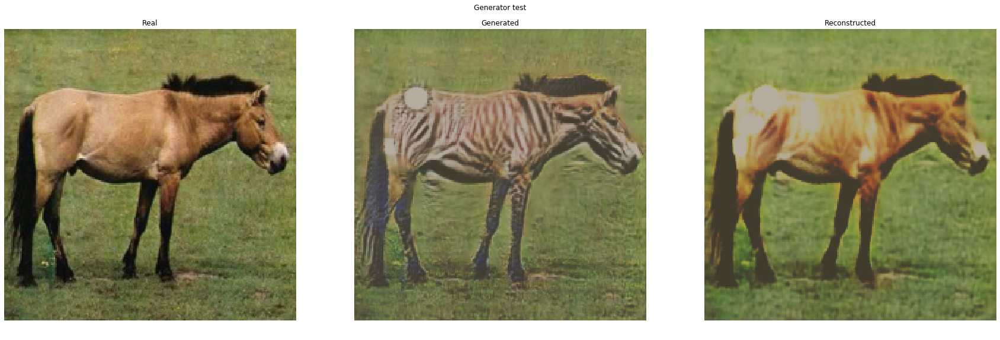

Epoch: (47/70) | Batch: (1/1067) | D_A_Loss: 0.4053 D_B_Loss: 0.5029 | G_A_Loss: 0.2504 G_B_Loss: 0.6462 | C_A_Loss: 5.5289 C_B_Loss: 3.5385 |
Epoch: (47/70) | Batch: (361/1067) | D_A_Loss: 1.4847 D_B_Loss: 0.6161 | G_A_Loss: 0.4500 G_B_Loss: 0.6220 | C_A_Loss: 2.0174 C_B_Loss: 3.5399 |
Epoch: (47/70) | Batch: (721/1067) | D_A_Loss: 0.5603 D_B_Loss: 0.1747 | G_A_Loss: 0.7955 G_B_Loss: 0.6399 | C_A_Loss: 4.0367 C_B_Loss: 9.7960 |
Epoch: (47/70) | Batch: (1067/1067) | D_A_Loss: 0.2182 D_B_Loss: 3.9749 | G_A_Loss: 0.9793 G_B_Loss: 0.0879 | C_A_Loss: 2.4933 C_B_Loss: 3.6783 |
Epoch: (48/70) | Batch: (1/1067) | D_A_Loss: 0.9582 D_B_Loss: 0.3874 | G_A_Loss: 0.3007 G_B_Loss: 0.3288 | C_A_Loss: 2.1148 C_B_Loss: 1.7144 |
Epoch: (48/70) | Batch: (361/1067) | D_A_Loss: 0.6917 D_B_Loss: 0.4936 | G_A_Loss: 0.4484 G_B_Loss: 0.5708 | C_A_Loss: 3.2980 C_B_Loss: 3.0566 |
Epoch: (48/70) | Batch: (721/1067) | D_A_Loss: 1.0491 D_B_Loss: 2.2410 | G_A_Loss: 0.8138 G_B_Loss: 0.2749 | C_A_Loss: 3.4992 C_B_Los

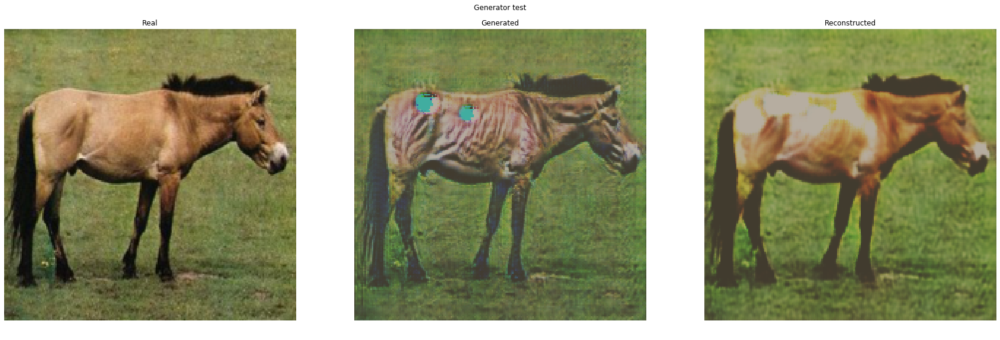

Epoch: (50/70) | Batch: (1/1067) | D_A_Loss: 3.6466 D_B_Loss: 0.1876 | G_A_Loss: 0.7720 G_B_Loss: 0.0982 | C_A_Loss: 2.3801 C_B_Loss: 4.0698 |
Epoch: (50/70) | Batch: (361/1067) | D_A_Loss: 0.6844 D_B_Loss: 0.6428 | G_A_Loss: 0.3678 G_B_Loss: 0.2389 | C_A_Loss: 4.2291 C_B_Loss: 2.8046 |
Epoch: (50/70) | Batch: (721/1067) | D_A_Loss: 0.4724 D_B_Loss: 0.8036 | G_A_Loss: 1.0363 G_B_Loss: 0.3726 | C_A_Loss: 3.0249 C_B_Loss: 2.4668 |
Epoch: (50/70) | Batch: (1067/1067) | D_A_Loss: 1.5173 D_B_Loss: 0.7036 | G_A_Loss: 0.2886 G_B_Loss: 0.5544 | C_A_Loss: 3.0957 C_B_Loss: 2.9710 |
Epoch: (51/70) | Batch: (1/1067) | D_A_Loss: 0.8865 D_B_Loss: 0.2925 | G_A_Loss: 0.5926 G_B_Loss: 0.3554 | C_A_Loss: 2.4481 C_B_Loss: 2.3342 |
Epoch: (51/70) | Batch: (361/1067) | D_A_Loss: 2.4745 D_B_Loss: 0.9706 | G_A_Loss: 0.6385 G_B_Loss: 0.2204 | C_A_Loss: 3.2037 C_B_Loss: 6.9451 |
Epoch: (51/70) | Batch: (721/1067) | D_A_Loss: 0.9075 D_B_Loss: 0.3345 | G_A_Loss: 0.2888 G_B_Loss: 0.9881 | C_A_Loss: 6.2491 C_B_Los

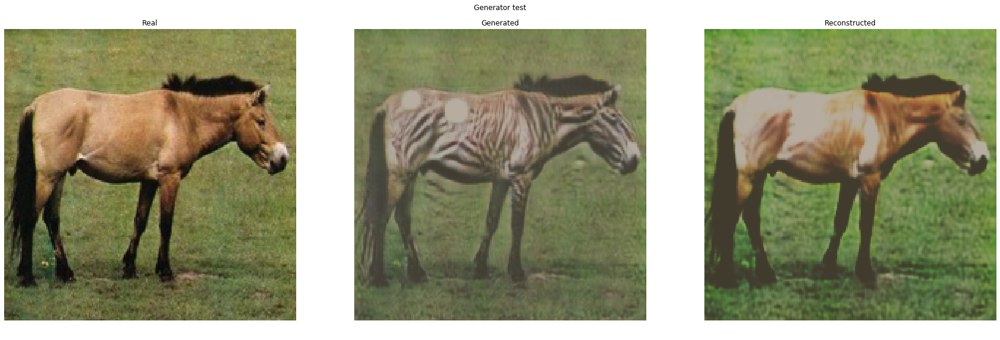

Epoch: (53/70) | Batch: (1/1067) | D_A_Loss: 1.2244 D_B_Loss: 1.1580 | G_A_Loss: 0.2389 G_B_Loss: 0.2562 | C_A_Loss: 2.8063 C_B_Loss: 4.4407 |
Epoch: (53/70) | Batch: (361/1067) | D_A_Loss: 1.6634 D_B_Loss: 0.4632 | G_A_Loss: 0.8585 G_B_Loss: 0.1637 | C_A_Loss: 1.4928 C_B_Loss: 2.3603 |
Epoch: (53/70) | Batch: (721/1067) | D_A_Loss: 0.9377 D_B_Loss: 0.1253 | G_A_Loss: 0.9720 G_B_Loss: 0.3770 | C_A_Loss: 7.2512 C_B_Loss: 3.3744 |
Epoch: (53/70) | Batch: (1067/1067) | D_A_Loss: 0.6470 D_B_Loss: 0.5343 | G_A_Loss: 0.6635 G_B_Loss: 0.2080 | C_A_Loss: 2.7515 C_B_Loss: 4.2149 |
Epoch: (54/70) | Batch: (1/1067) | D_A_Loss: 0.2803 D_B_Loss: 0.1582 | G_A_Loss: 0.8196 G_B_Loss: 0.3616 | C_A_Loss: 2.4776 C_B_Loss: 6.6317 |
Epoch: (54/70) | Batch: (361/1067) | D_A_Loss: 1.0614 D_B_Loss: 0.1702 | G_A_Loss: 0.5774 G_B_Loss: 0.3632 | C_A_Loss: 3.5267 C_B_Loss: 1.7677 |
Epoch: (54/70) | Batch: (721/1067) | D_A_Loss: 0.6840 D_B_Loss: 0.5065 | G_A_Loss: 0.2997 G_B_Loss: 0.4387 | C_A_Loss: 3.7874 C_B_Los

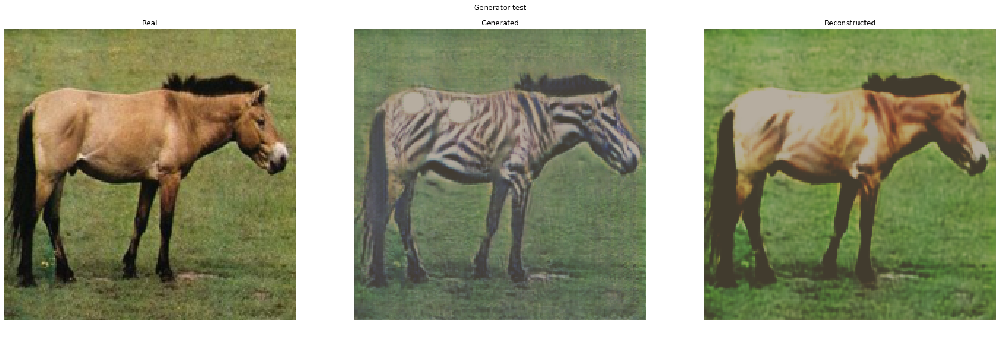

Epoch: (56/70) | Batch: (1/1067) | D_A_Loss: 1.1666 D_B_Loss: 0.4309 | G_A_Loss: 0.3262 G_B_Loss: 0.6381 | C_A_Loss: 3.2693 C_B_Loss: 2.2531 |
Epoch: (56/70) | Batch: (361/1067) | D_A_Loss: 0.2359 D_B_Loss: 0.6955 | G_A_Loss: 0.8518 G_B_Loss: 0.4637 | C_A_Loss: 2.1204 C_B_Loss: 2.1689 |
Epoch: (56/70) | Batch: (721/1067) | D_A_Loss: 0.3445 D_B_Loss: 0.5527 | G_A_Loss: 0.4476 G_B_Loss: 0.6803 | C_A_Loss: 2.4961 C_B_Loss: 3.4952 |
Epoch: (56/70) | Batch: (1067/1067) | D_A_Loss: 1.1975 D_B_Loss: 0.2430 | G_A_Loss: 0.5617 G_B_Loss: 0.6700 | C_A_Loss: 2.6295 C_B_Loss: 4.4100 |
Epoch: (57/70) | Batch: (1/1067) | D_A_Loss: 1.7510 D_B_Loss: 0.5173 | G_A_Loss: 0.8897 G_B_Loss: 0.2504 | C_A_Loss: 2.3931 C_B_Loss: 3.0559 |
Epoch: (57/70) | Batch: (361/1067) | D_A_Loss: 0.9688 D_B_Loss: 0.3575 | G_A_Loss: 0.2460 G_B_Loss: 0.5310 | C_A_Loss: 1.8056 C_B_Loss: 2.6592 |
Epoch: (57/70) | Batch: (721/1067) | D_A_Loss: 0.3660 D_B_Loss: 0.2910 | G_A_Loss: 0.5819 G_B_Loss: 0.2917 | C_A_Loss: 4.8445 C_B_Los

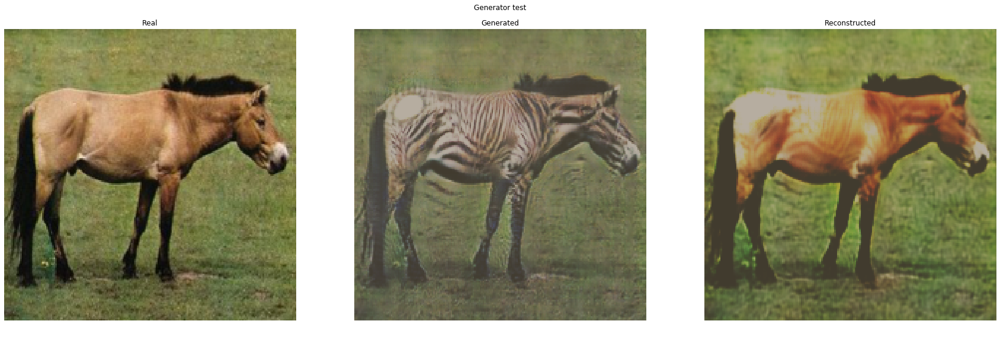

Epoch: (59/70) | Batch: (1/1067) | D_A_Loss: 0.3026 D_B_Loss: 0.6028 | G_A_Loss: 0.6536 G_B_Loss: 0.7647 | C_A_Loss: 3.6162 C_B_Loss: 3.5014 |
Epoch: (59/70) | Batch: (361/1067) | D_A_Loss: 0.4198 D_B_Loss: 0.3304 | G_A_Loss: 0.8609 G_B_Loss: 0.8295 | C_A_Loss: 1.3730 C_B_Loss: 2.7051 |
Epoch: (59/70) | Batch: (721/1067) | D_A_Loss: 1.0822 D_B_Loss: 0.4297 | G_A_Loss: 0.8671 G_B_Loss: 0.3672 | C_A_Loss: 1.5367 C_B_Loss: 2.9625 |
Epoch: (59/70) | Batch: (1067/1067) | D_A_Loss: 0.9074 D_B_Loss: 0.1728 | G_A_Loss: 0.4840 G_B_Loss: 0.5441 | C_A_Loss: 1.9687 C_B_Loss: 2.0092 |
Epoch: (60/70) | Batch: (1/1067) | D_A_Loss: 0.5476 D_B_Loss: 0.2861 | G_A_Loss: 0.5197 G_B_Loss: 0.3393 | C_A_Loss: 2.0042 C_B_Loss: 2.4911 |
Epoch: (60/70) | Batch: (361/1067) | D_A_Loss: 0.1866 D_B_Loss: 0.5833 | G_A_Loss: 0.4017 G_B_Loss: 0.4386 | C_A_Loss: 2.6491 C_B_Loss: 3.6289 |
Epoch: (60/70) | Batch: (721/1067) | D_A_Loss: 0.9950 D_B_Loss: 0.3454 | G_A_Loss: 0.6681 G_B_Loss: 0.7230 | C_A_Loss: 3.3918 C_B_Los

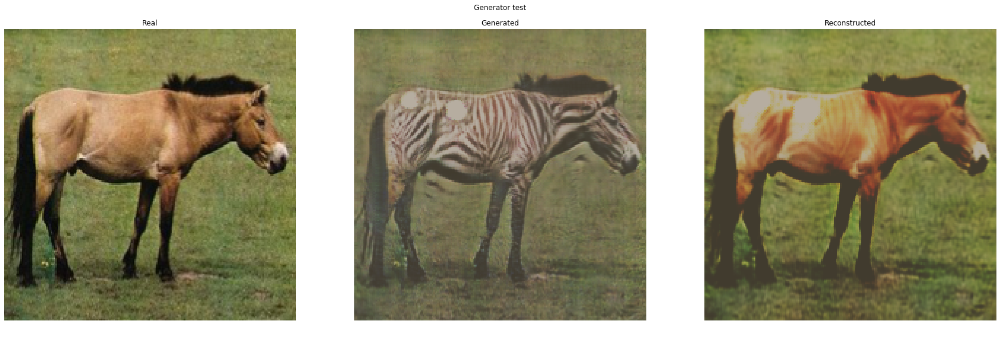

Epoch: (62/70) | Batch: (1/1067) | D_A_Loss: 0.9759 D_B_Loss: 0.3073 | G_A_Loss: 0.2366 G_B_Loss: 0.2823 | C_A_Loss: 2.4765 C_B_Loss: 2.6352 |
Epoch: (62/70) | Batch: (361/1067) | D_A_Loss: 0.3759 D_B_Loss: 0.2442 | G_A_Loss: 0.8848 G_B_Loss: 0.5163 | C_A_Loss: 7.4777 C_B_Loss: 2.9078 |
Epoch: (62/70) | Batch: (721/1067) | D_A_Loss: 1.2748 D_B_Loss: 1.2070 | G_A_Loss: 0.5653 G_B_Loss: 0.2217 | C_A_Loss: 0.8344 C_B_Loss: 3.5528 |
Epoch: (62/70) | Batch: (1067/1067) | D_A_Loss: 1.3011 D_B_Loss: 0.5045 | G_A_Loss: 0.4781 G_B_Loss: 0.4660 | C_A_Loss: 2.5609 C_B_Loss: 3.4798 |
Epoch: (63/70) | Batch: (1/1067) | D_A_Loss: 1.1521 D_B_Loss: 0.8772 | G_A_Loss: 0.3568 G_B_Loss: 0.5686 | C_A_Loss: 4.4439 C_B_Loss: 2.0399 |
Epoch: (63/70) | Batch: (361/1067) | D_A_Loss: 1.1387 D_B_Loss: 0.2168 | G_A_Loss: 0.9367 G_B_Loss: 0.3686 | C_A_Loss: 2.1015 C_B_Loss: 2.3727 |
Epoch: (63/70) | Batch: (721/1067) | D_A_Loss: 1.0894 D_B_Loss: 0.2017 | G_A_Loss: 0.5541 G_B_Loss: 0.5701 | C_A_Loss: 1.7389 C_B_Los

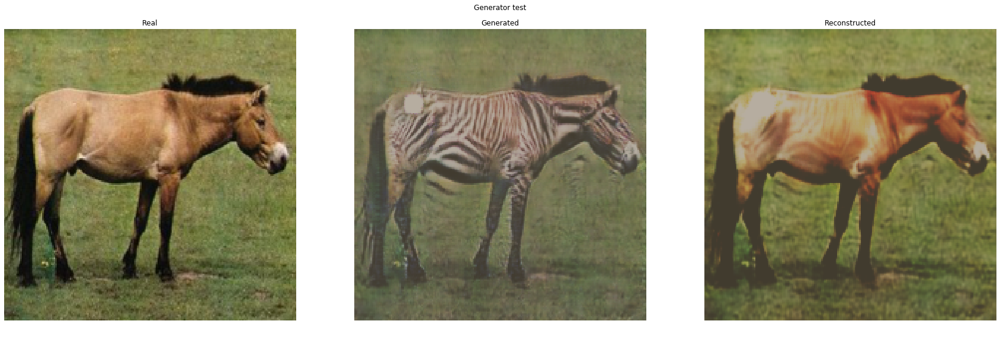

Epoch: (65/70) | Batch: (1/1067) | D_A_Loss: 1.4129 D_B_Loss: 1.2696 | G_A_Loss: 0.2039 G_B_Loss: 0.4671 | C_A_Loss: 2.0246 C_B_Loss: 1.3522 |
Epoch: (65/70) | Batch: (361/1067) | D_A_Loss: 0.4012 D_B_Loss: 0.2970 | G_A_Loss: 0.5198 G_B_Loss: 0.3317 | C_A_Loss: 3.9950 C_B_Loss: 3.3140 |
Epoch: (65/70) | Batch: (721/1067) | D_A_Loss: 0.4761 D_B_Loss: 0.6705 | G_A_Loss: 0.3683 G_B_Loss: 0.7387 | C_A_Loss: 4.9874 C_B_Loss: 3.0962 |
Epoch: (65/70) | Batch: (1067/1067) | D_A_Loss: 0.5983 D_B_Loss: 0.6445 | G_A_Loss: 0.4051 G_B_Loss: 0.5749 | C_A_Loss: 1.8954 C_B_Loss: 2.2098 |
Epoch: (66/70) | Batch: (1/1067) | D_A_Loss: 0.9322 D_B_Loss: 1.4733 | G_A_Loss: 0.1968 G_B_Loss: 0.2085 | C_A_Loss: 0.9229 C_B_Loss: 1.7919 |
Epoch: (66/70) | Batch: (361/1067) | D_A_Loss: 1.1301 D_B_Loss: 0.2392 | G_A_Loss: 0.5968 G_B_Loss: 0.9410 | C_A_Loss: 3.7500 C_B_Loss: 5.1897 |
Epoch: (66/70) | Batch: (721/1067) | D_A_Loss: 1.8663 D_B_Loss: 1.1354 | G_A_Loss: 0.5716 G_B_Loss: 0.1873 | C_A_Loss: 1.9996 C_B_Los

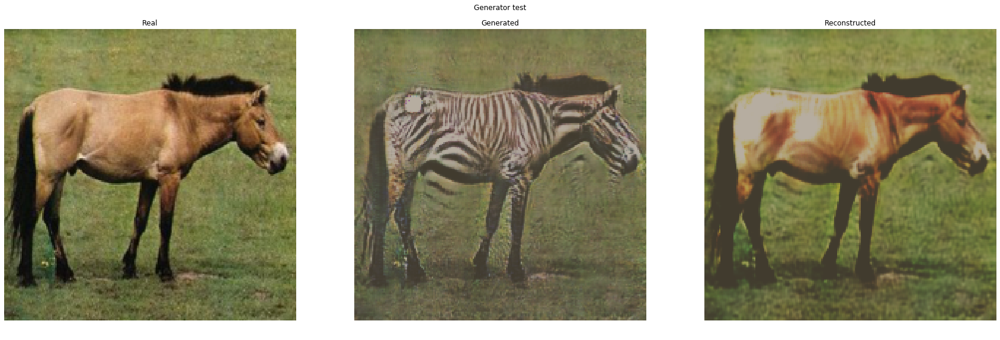

Epoch: (68/70) | Batch: (1/1067) | D_A_Loss: 0.6253 D_B_Loss: 1.2215 | G_A_Loss: 0.3335 G_B_Loss: 0.2346 | C_A_Loss: 4.1583 C_B_Loss: 2.9023 |
Epoch: (68/70) | Batch: (361/1067) | D_A_Loss: 0.7679 D_B_Loss: 0.4069 | G_A_Loss: 0.6673 G_B_Loss: 0.4040 | C_A_Loss: 2.2713 C_B_Loss: 3.2707 |
Epoch: (68/70) | Batch: (721/1067) | D_A_Loss: 0.6028 D_B_Loss: 0.4540 | G_A_Loss: 0.5722 G_B_Loss: 0.6626 | C_A_Loss: 2.0858 C_B_Loss: 2.9729 |
Epoch: (68/70) | Batch: (1067/1067) | D_A_Loss: 1.3169 D_B_Loss: 0.5218 | G_A_Loss: 0.5961 G_B_Loss: 0.5293 | C_A_Loss: 8.1384 C_B_Loss: 3.3855 |
Epoch: (69/70) | Batch: (1/1067) | D_A_Loss: 1.0890 D_B_Loss: 1.4126 | G_A_Loss: 0.3745 G_B_Loss: 0.2885 | C_A_Loss: 4.9699 C_B_Loss: 2.2137 |
Epoch: (69/70) | Batch: (361/1067) | D_A_Loss: 1.0465 D_B_Loss: 0.4966 | G_A_Loss: 0.4476 G_B_Loss: 0.2931 | C_A_Loss: 1.4462 C_B_Loss: 2.0513 |
Epoch: (69/70) | Batch: (721/1067) | D_A_Loss: 1.2746 D_B_Loss: 1.1389 | G_A_Loss: 0.6213 G_B_Loss: 0.4670 | C_A_Loss: 2.6332 C_B_Los

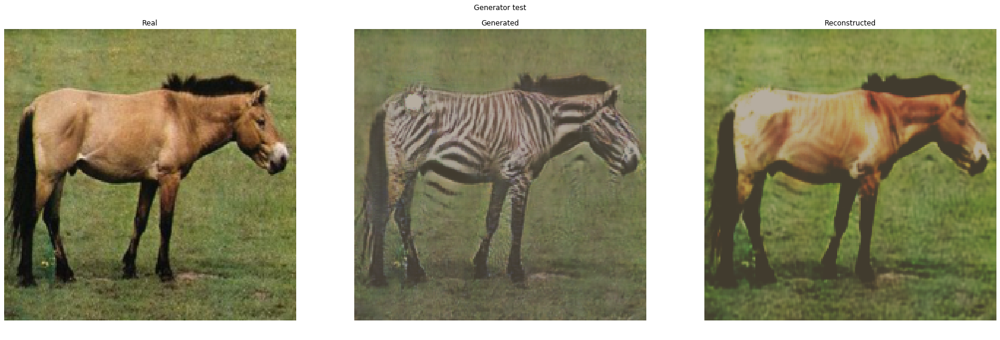

Training Completed!


In [24]:
if TRAIN_DATA:
    G_A2B, G_B2A, D_A_loss_list, D_B_loss_list, G_A_loss_list, G_B_loss_list, Cyclic_A_loss_list, Cyclic_B_loss_list = train(
        dataloader_A, dataloader_B)
    

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


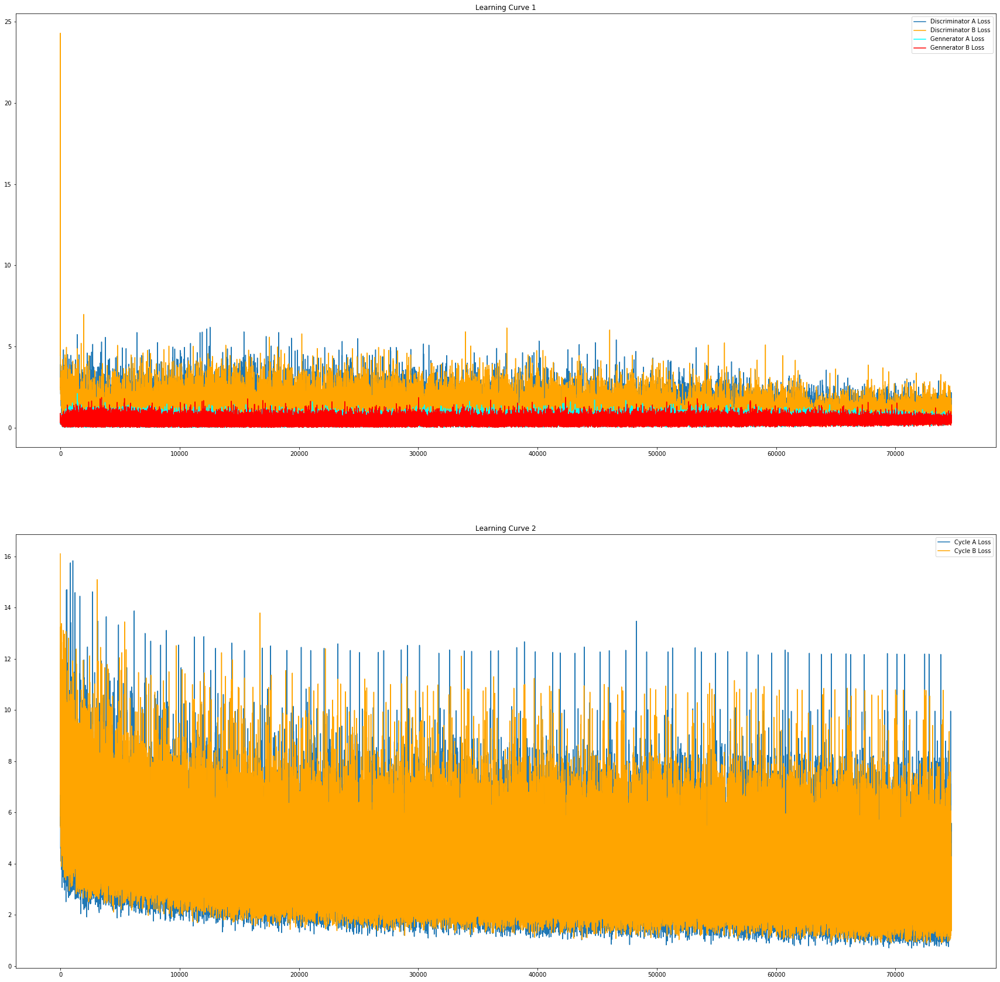

In [25]:
#Plot learning curves
def plot(D_A_loss_list, D_B_loss_list, G_A_loss_list, G_B_loss_list, Cyclic_A_loss_list, Cyclic_B_loss_list, EPOCHS=None):
    if EPOCHS is None:
        EPOCHS = len(D_A_loss_list)
    fig = plt.figure(figsize=(30,30))
    fig.add_subplot(2,1,1)
    plt.plot(range(EPOCHS), D_A_loss_list,label = "Discriminator A Loss")
    plt.plot(range(EPOCHS),D_B_loss_list, color ="orange",label = "Discriminator B Loss")
    plt.plot(range(EPOCHS),G_A_loss_list, color ="cyan",label = "Gennerator A Loss")
    plt.plot(range(EPOCHS),G_B_loss_list, color ="red",label = "Gennerator B Loss")
    plt.title("Learning Curve 1")
    plt.legend()
    
    fig.add_subplot(2,1,2)
    plt.plot(range(EPOCHS), Cyclic_A_loss_list,label = "Cycle A Loss")
    plt.plot(range(EPOCHS), Cyclic_B_loss_list, color ="orange",label = "Cycle B Loss")
    plt.title("Learning Curve 2")
    plt.legend()
    plt.show()
if TRAIN_DATA: 
    plot(D_A_loss_list, D_B_loss_list, G_A_loss_list, G_B_loss_list, Cyclic_A_loss_list, Cyclic_B_loss_list)

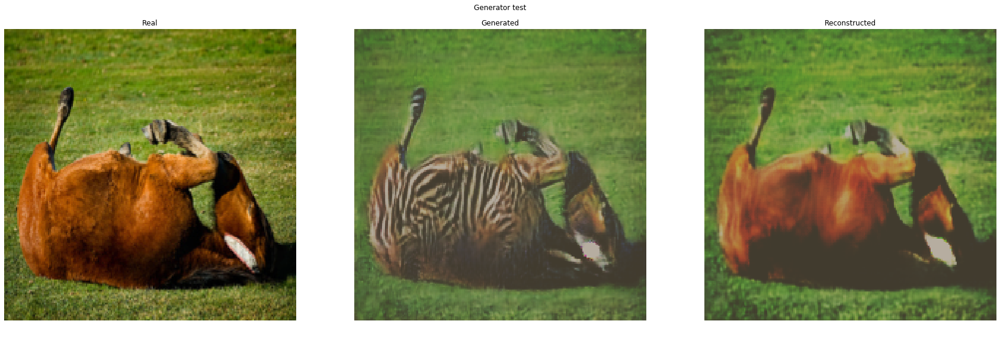

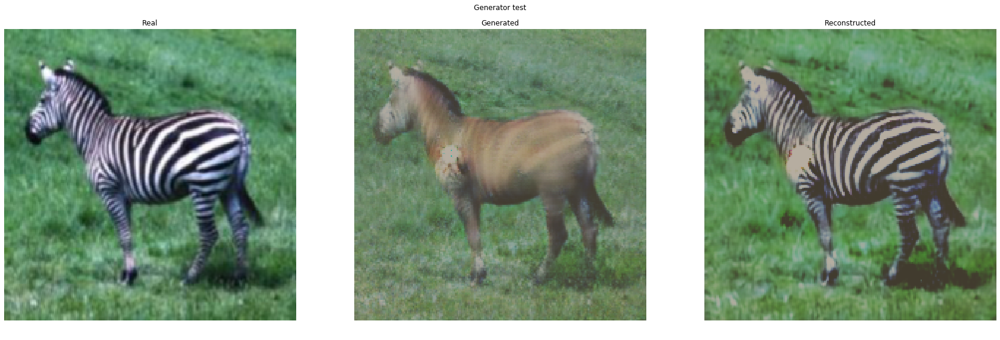

In [28]:
if not TRAIN_DATA:
    G_A2B.load_state_dict(torch.load("model/generatorA-69.pth"))
    G_B2A.load_state_dict(torch.load("model/generatorB-69.pth"))

test_A = Image.open("data/test/testA/n02381460_4660.jpg")
test_B = Image.open("data/test/testB/n02391049_4890.jpg")

generate_img(G_A2B,G_B2A,test_A,"A")
generate_img(G_A2B,G_B2A,test_B,"B")